In [1]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore the warnings
import warnings
warnings.filterwarnings("ignore")

#loading MNIST dataset
from tensorflow.keras.datasets import mnist

(X_train,y_train) , (X_test,y_test)=mnist.load_data()

In [2]:
print(X_train.shape)
print(X_test.shape)

(60000, 28, 28)
(10000, 28, 28)


In [3]:
np.unique(y_train)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

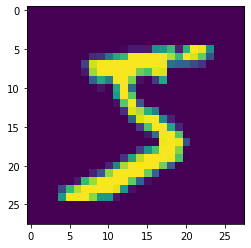

In [4]:
plt.imshow(X_train[0])

In [5]:
X_train

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ...,

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [6]:
X_train.shape

(60000, 28, 28)

In [7]:
X_train=X_train.reshape(len(X_train),28*28)
X_test=X_test.reshape(len(X_test),28*28)

In [8]:
X_train

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

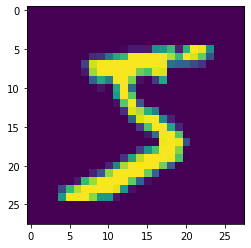

In [9]:
plt.imshow(X_train[0].reshape(28,28))

In [10]:
# values = []
# for i in range(28*28):
#     values.append('pixel{}'.format(i))
# X_train = pd.DataFrame(X_train,columns=values)
# X_train['label'] = y_train
# X_test = pd.DataFrame(X_test,columns=values)
# X_test['label'] = y_test
# X_train.head()

In [11]:
# print(X_train.shape)
# print(X_test.shape)

In [12]:
X_test

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [13]:
# plt.imshow(X_train.iloc[0,:-1].values.reshape(28,28))

In [14]:
# df = X_train.append(X_test)
# # or
# # df = pd.concat([X_train,X_test])
# df.shape

In [15]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [16]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time()-start)

36.961848974227905


In [17]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9688

In [18]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [19]:
#PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=100)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [20]:
X_train_trf.shape

(60000, 100)

In [21]:
knn = KNeighborsClassifier()
knn.fit(X_train_trf,y_train)
import time
start = time.time()
y_pred = knn.predict(X_test_trf)
print(time.time()-start)
accuracy_score(y_test,y_pred)

28.331032514572144


0.958

In [22]:
for i in range(90,101):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    print({'n_components':i,'Accuracy':accuracy_score(y_test,y_pred)})

{'n_components': 90, 'Accuracy': 0.9579}
{'n_components': 91, 'Accuracy': 0.9578}
{'n_components': 92, 'Accuracy': 0.9575}
{'n_components': 93, 'Accuracy': 0.9584}
{'n_components': 94, 'Accuracy': 0.957}
{'n_components': 95, 'Accuracy': 0.9577}
{'n_components': 96, 'Accuracy': 0.9592}
{'n_components': 97, 'Accuracy': 0.958}
{'n_components': 98, 'Accuracy': 0.9576}
{'n_components': 99, 'Accuracy': 0.9582}
{'n_components': 100, 'Accuracy': 0.9578}


In [23]:
pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [24]:
X_train_trf

array([[-0.92234557, -4.81484531],
       [ 8.70904709, -7.754149  ],
       [ 2.32858458,  9.43173643],
       ...,
       [-3.77740071, -3.23073887],
       [ 1.72239234, -4.94775735],
       [-1.42721382, -6.17559201]])

In [27]:
import plotly.express as px

y_train_trf = y_train.astype(str)

fig = px.scatter(x = X_train_trf[:,0],
                y = X_train_trf[:,1],
                color = y_train_trf,
                color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [28]:
pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [29]:
X_train_trf

array([[-9.22463185e-01, -4.81465789e+00,  5.90361024e-02],
       [ 8.70904473e+00, -7.75441000e+00, -3.44642089e+00],
       [ 2.32827684e+00,  9.43220976e+00, -6.18975276e+00],
       ...,
       [-3.77729556e+00, -3.23045789e+00, -3.80719201e+00],
       [ 1.72238748e+00, -4.94811806e+00,  7.97249360e-03],
       [-1.42733284e+00, -6.17562421e+00, -2.96921575e+00]])

In [34]:
y_train_trf = y_train.astype(str)

fig = px.scatter_3d(x = X_train_trf[:,0],
                y = X_train_trf[:,1],
                z =  X_train_trf[:,-1],
                color = y_train_trf)
fig.update_layout(margin=dict(l=20, r=20,t=20, b=20))
    
#color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [36]:
pca.explained_variance_
# Eigen values

array([40.4876351 , 29.24169749, 26.81179425])

In [39]:
pca.components_
# Eigen vector

array([[ 4.12053214e-19,  2.13041692e-19,  2.29088587e-19, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 4.44959258e-17, -8.06111039e-18, -2.90493696e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-2.22863156e-16,  1.47367194e-17,  3.86516308e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00]])

In [40]:
pca.components_.shape

(3, 784)

In [43]:
pca.explained_variance_ratio_

array([0.05646717, 0.04078272, 0.03739379])

# To find optimum PCA

In [44]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [45]:
pca.components_.shape

(784, 784)

In [46]:
pca.explained_variance_ratio_

array([5.64671692e-02, 4.07827199e-02, 3.73938042e-02, 2.88511485e-02,
       2.52110863e-02, 2.19426996e-02, 1.92334439e-02, 1.74579923e-02,
       1.53509230e-02, 1.40171960e-02, 1.34174302e-02, 1.20374194e-02,
       1.11456955e-02, 1.08992356e-02, 1.02864922e-02, 9.94486564e-03,
       9.36383280e-03, 9.21045666e-03, 8.93436778e-03, 8.69912619e-03,
       8.27363019e-03, 8.03417369e-03, 7.64845500e-03, 7.41772464e-03,
       7.15292868e-03, 6.91846831e-03, 6.84135964e-03, 6.56674546e-03,
       6.31676724e-03, 6.12919839e-03, 5.96255295e-03, 5.87716416e-03,
       5.71591699e-03, 5.62307416e-03, 5.54682002e-03, 5.38418374e-03,
       5.31182250e-03, 5.19605602e-03, 5.08211255e-03, 4.80005571e-03,
       4.76455820e-03, 4.69139360e-03, 4.54348956e-03, 4.51345787e-03,
       4.46963401e-03, 4.43383155e-03, 4.38215469e-03, 4.30381751e-03,
       4.26877901e-03, 4.23647017e-03, 4.04696121e-03, 3.99447403e-03,
       3.97456119e-03, 3.93820800e-03, 3.85813590e-03, 3.79042674e-03,
      

In [47]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05646717, 0.09724989, 0.13464369, 0.16349484, 0.18870593,
       0.21064863, 0.22988207, 0.24734006, 0.26269099, 0.27670818,
       0.29012561, 0.30216303, 0.31330873, 0.32420796, 0.33449446,
       0.34443932, 0.35380315, 0.36301361, 0.37194798, 0.3806471 ,
       0.38892074, 0.39695491, 0.40460336, 0.41202109, 0.41917402,
       0.42609249, 0.43293384, 0.43950059, 0.44581736, 0.45194656,
       0.45790911, 0.46378627, 0.46950219, 0.47512526, 0.48067208,
       0.48605627, 0.49136809, 0.49656415, 0.50164626, 0.50644631,
       0.51121087, 0.51590227, 0.52044576, 0.52495921, 0.52942885,
       0.53386268, 0.53824483, 0.54254865, 0.54681743, 0.5510539 ,
       0.55510086, 0.55909534, 0.5630699 , 0.56700811, 0.57086624,
       0.57465667, 0.57841069, 0.58211845, 0.5857679 , 0.5893609 ,
       0.59288472, 0.59636266, 0.59980677, 0.60320546, 0.606565  ,
       0.60991386, 0.6132325 , 0.61646276, 0.61962553, 0.62275797,
       0.62586528, 0.62893771, 0.63198685, 0.63501403, 0.63800

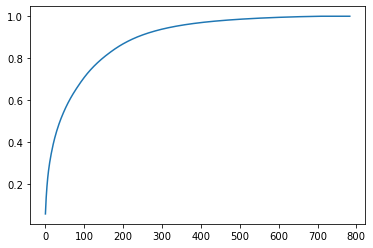

In [48]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
# choose threshold with 90% to 97%